In [17]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as plx
import matplotlib.ticker as ticker

In [3]:
data=pd.read_csv("Sample Of Data.csv")

In [6]:
data["Indicator Name"]=data["Indicator Name"].str.replace("Population, female (% of total population)","Total Population")
data

,Country Name,Country Code,Indicator Name,Indicator Code,Years,Total Popluation,Region 1,Region 2,IncomeGroup
0,Aruba,ABW,Total Population,SP.POP.TOTL.FE.ZS,1960,50.858849,Latin America,Caribbean,High income
1,Aruba,ABW,Total Population,SP.POP.TOTL.FE.ZS,1961,50.850191,Latin America,Caribbean,High income
2,Aruba,ABW,Total Population,SP.POP.TOTL.FE.ZS,1962,50.845065,Latin America,Caribbean,High income
3,Aruba,ABW,Total Population,SP.POP.TOTL.FE.ZS,1963,50.836016,Latin America,Caribbean,High income
4,Aruba,ABW,Total Population,SP.POP.TOTL.FE.ZS,1964,50.826773,Latin America,Caribbean,High income
...,...,...,...,...,...,...,...,...,...
16690,Zimbabwe,ZWE,Total Population,SP.POP.TOTL.FE.ZS,2018,52.923755,Sub-Saharan Africa,NaN,Lower middle income
16691,Zimbabwe,ZWE,Total Population,SP.POP.TOTL.FE.ZS,2019,52.900198,Sub-Saharan Africa,NaN,Lower middle income
16692,Zimbabwe,ZWE,Total Population,SP.POP.TOTL.FE.ZS,2020,52.869327,Sub-Saharan Africa,NaN,Lower middle income
16693,Zimbabwe,ZWE,Total Population,SP.POP.TOTL.FE.ZS,2021,52.832847,Sub-Saharan Africa,NaN,Lower middle income


In [5]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16695 entries, 0 to 16694
Data columns (total 9 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   Country Name      16695 non-null  object 
 1   Country Code      16695 non-null  object 
 2   Indicator Name    16695 non-null  object 
 3   Indicator Code    16695 non-null  object 
 4   Years             16695 non-null  int64  
 5   Total Popluation  16695 non-null  float64
 6   Region 1          13671 non-null  object 
 7   Region 2          9954 non-null   object 
 8   IncomeGroup       13608 non-null  object 
dtypes: float64(1), int64(1), object(7)
memory usage: 1.1+ MB


In [7]:
data.dropna(inplace=True)
data

,Country Name,Country Code,Indicator Name,Indicator Code,Years,Total Popluation,Region 1,Region 2,IncomeGroup
0,Aruba,ABW,Total Population,SP.POP.TOTL.FE.ZS,1960,50.858849,Latin America,Caribbean,High income
1,Aruba,ABW,Total Population,SP.POP.TOTL.FE.ZS,1961,50.850191,Latin America,Caribbean,High income
2,Aruba,ABW,Total Population,SP.POP.TOTL.FE.ZS,1962,50.845065,Latin America,Caribbean,High income
3,Aruba,ABW,Total Population,SP.POP.TOTL.FE.ZS,1963,50.836016,Latin America,Caribbean,High income
4,Aruba,ABW,Total Population,SP.POP.TOTL.FE.ZS,1964,50.826773,Latin America,Caribbean,High income
...,...,...,...,...,...,...,...,...,...
16501,"Yemen, Rep.",YEM,Total Population,SP.POP.TOTL.FE.ZS,2018,49.403386,Middle East,North Africa,Low income
16502,"Yemen, Rep.",YEM,Total Population,SP.POP.TOTL.FE.ZS,2019,49.428680,Middle East,North Africa,Low income
16503,"Yemen, Rep.",YEM,Total Population,SP.POP.TOTL.FE.ZS,2020,49.445683,Middle East,North Africa,Low income
16504,"Yemen, Rep.",YEM,Total Population,SP.POP.TOTL.FE.ZS,2021,49.461487,Middle East,North Africa,Low income


In [8]:
# Display the count of unique values for each column

value_counts_per_column = {}

for column in data.columns:
    value_counts_per_column[column] = len(data[column].unique())

# Display the count of unique values for each column
for column, count in value_counts_per_column.items():
    print(f"{column}: {count}")

Country Name: 157
Country Code: 157
Indicator Name: 1
Indicator Code: 1
Years: 63
Total Popluation: 9890
Region 1: 4
Region 2: 4
IncomeGroup: 4


In [10]:
# check if there is dublicted columns
data.columns.duplicated()


array([False, False, False, False, False, False, False, False, False])

In [11]:
# check if there is outliers
data.describe()

,Years,Total Popluation
count,9891.000000,9891.000000
mean,1991.000000,49.982853
std,18.185162,2.916674
min,1960.000000,23.394217
25%,1975.000000,49.416964
50%,1991.000000,50.309615
75%,2007.000000,51.278718
max,2022.000000,55.906252


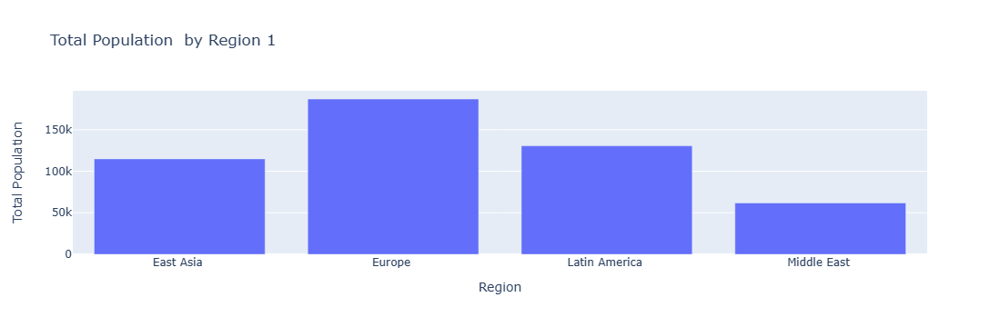

In [13]:
# Group the data by "Region 2" and calculate the sum of total population
region_population = data.groupby("Region 1")["Total Popluation"].sum().reset_index()

# Plotting the bar chart
fig = plx.bar(region_population, x='Region 1', y='Total Popluation', 
             labels={'Region 1': 'Region', 'Total Popluation': 'Total Population '},
             title='Total Population  by Region 1')
fig.show()

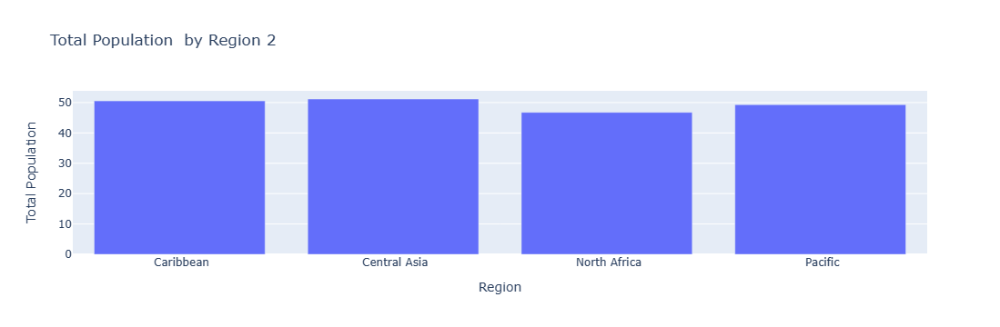

In [15]:
# Group the data by "Region 2" and calculate the mean of total population
region_population = data.groupby("Region 2")["Total Popluation"].mean().reset_index()

# Plotting the bar chart
fig = plx.bar(region_population, x='Region 2', y='Total Popluation', 
             labels={'Region 2': 'Region', 'Total Popluation': 'Total Population '},
             title='Total Population  by Region 2')
fig.show()

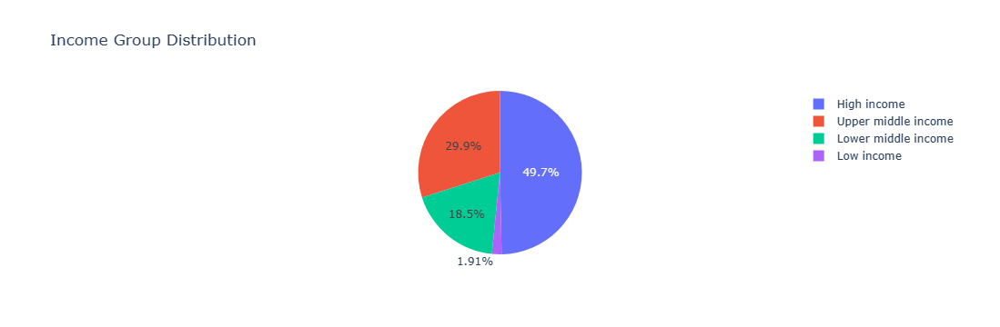

In [16]:
# Create a pie chart showing the distribution of income groups
fig = plx.pie(data, names='IncomeGroup', title='Income Group Distribution')
fig.show()

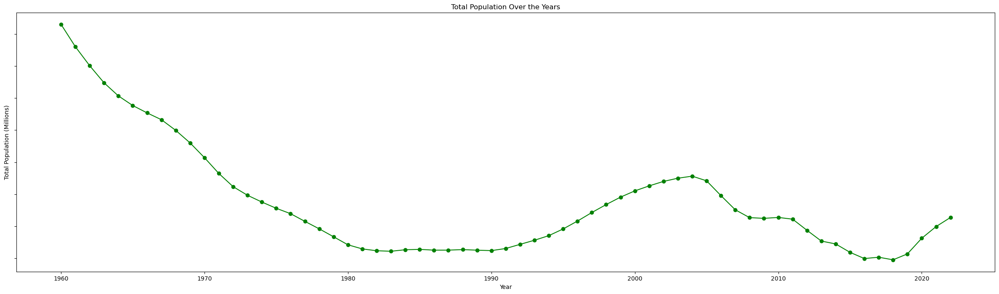

In [18]:
# Group the data by year and calculate the total population for each year
total_population_by_year = data.groupby('Years')['Total Popluation'].sum().reset_index()

# Convert total population to millions
total_population_by_year['Total Popluation (Millions)'] = total_population_by_year['Total Popluation'] / 1e6

# Plotting the line chart with total population as labels
plt.figure(figsize=(30
                    , 8))  
plt.plot(total_population_by_year['Years'], total_population_by_year['Total Popluation (Millions)'], marker='o', color='green')  
plt.title('Total Population Over the Years')
plt.xlabel('Year')
plt.ylabel('Total Population (Millions)')
plt.grid(False)
plt.gca().yaxis.set_major_formatter(ticker.NullFormatter())

plt.show()

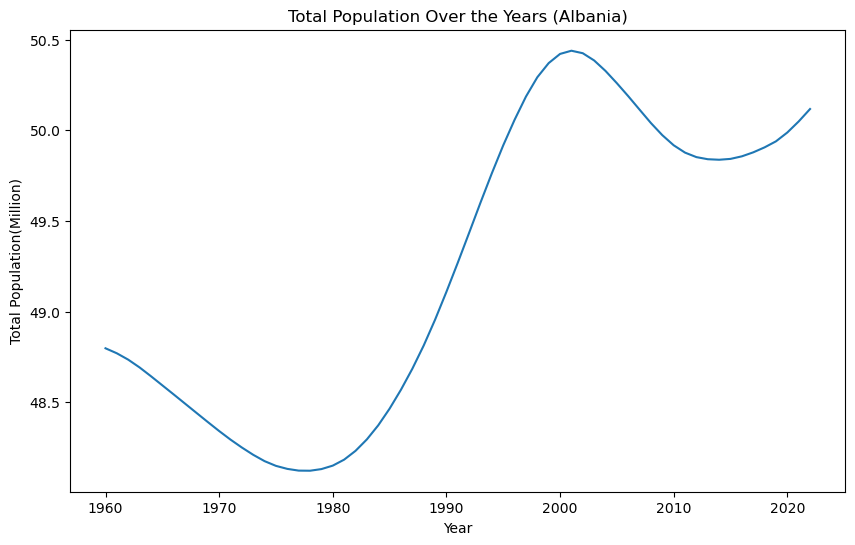

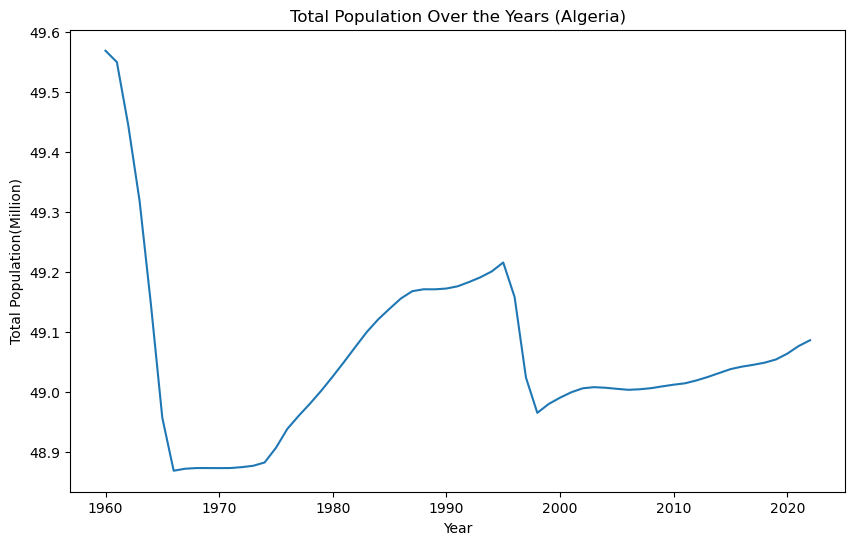

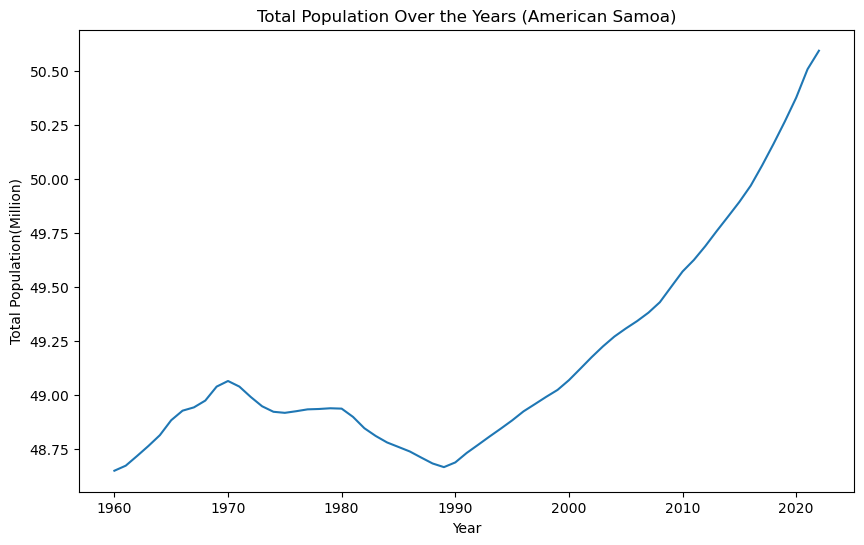

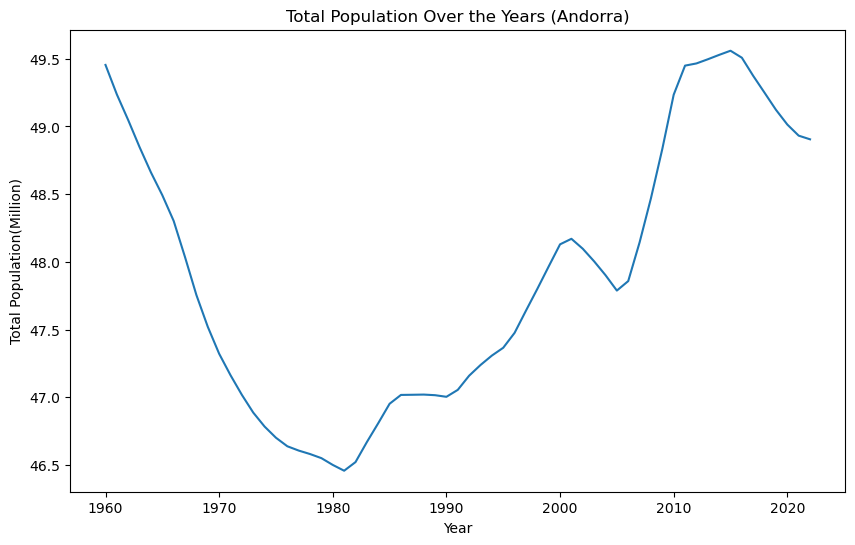

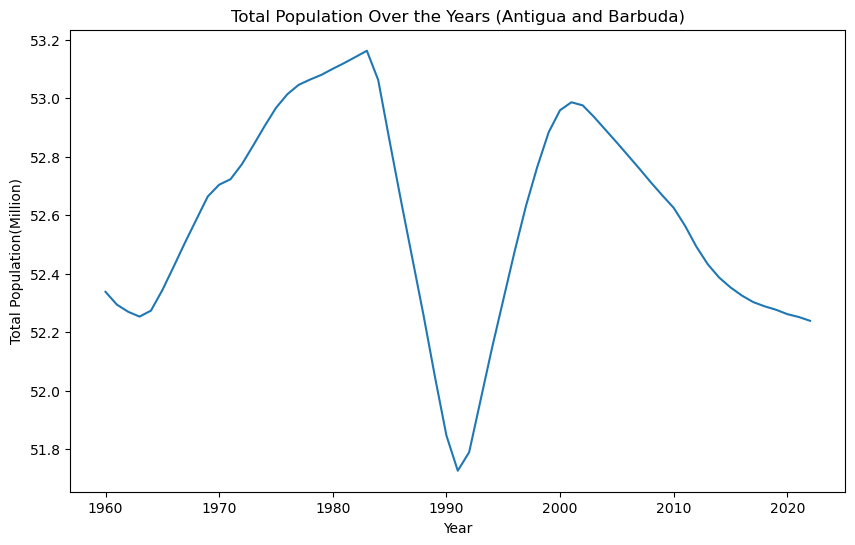

...

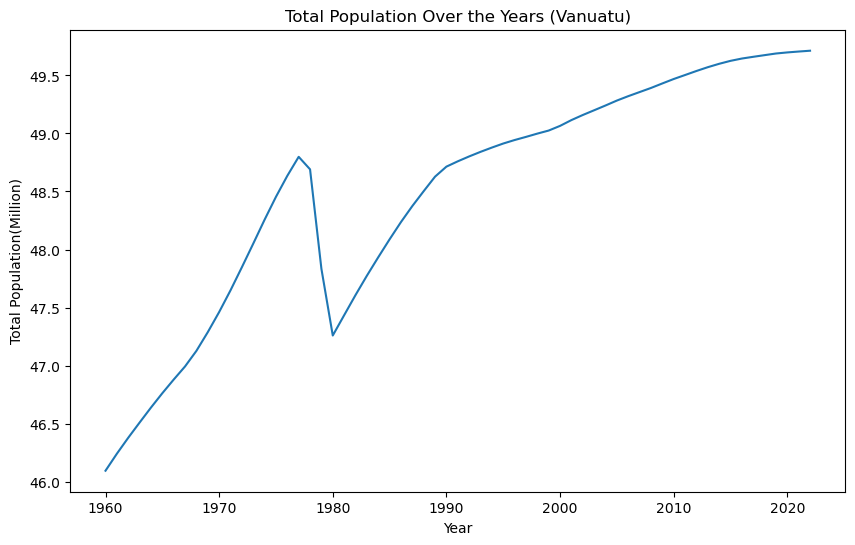

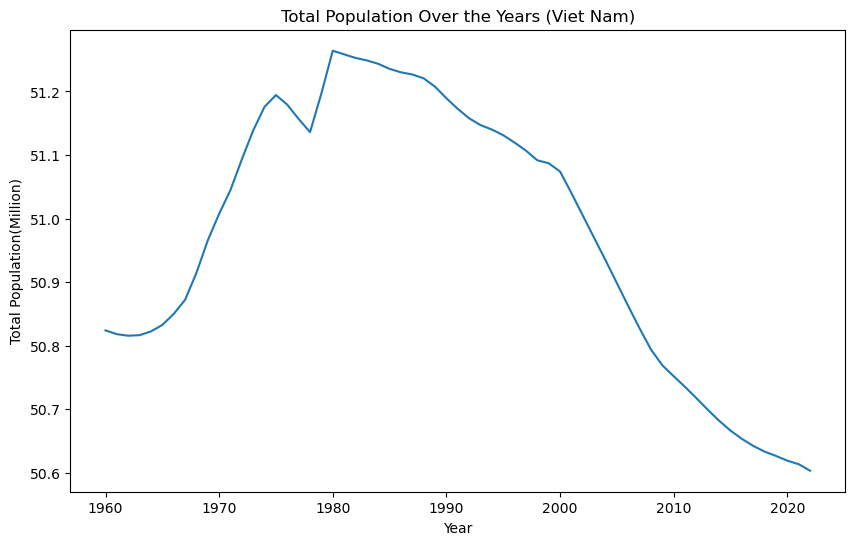

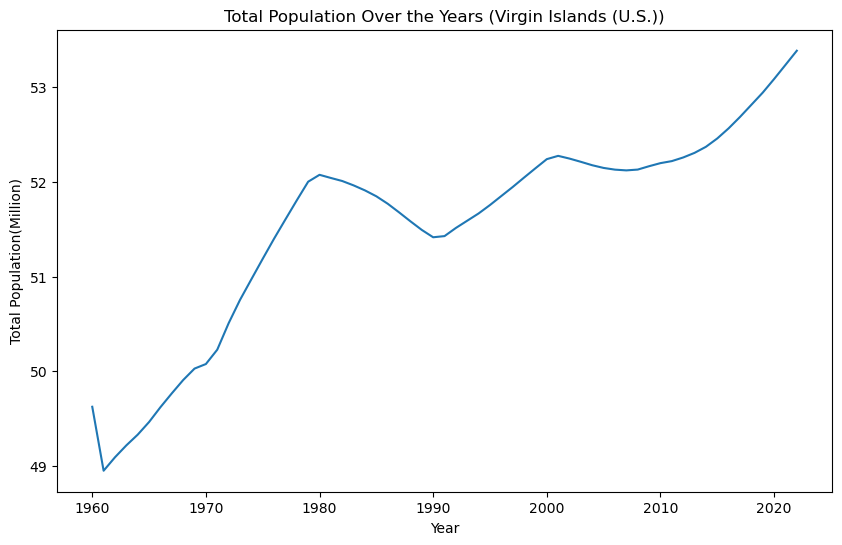

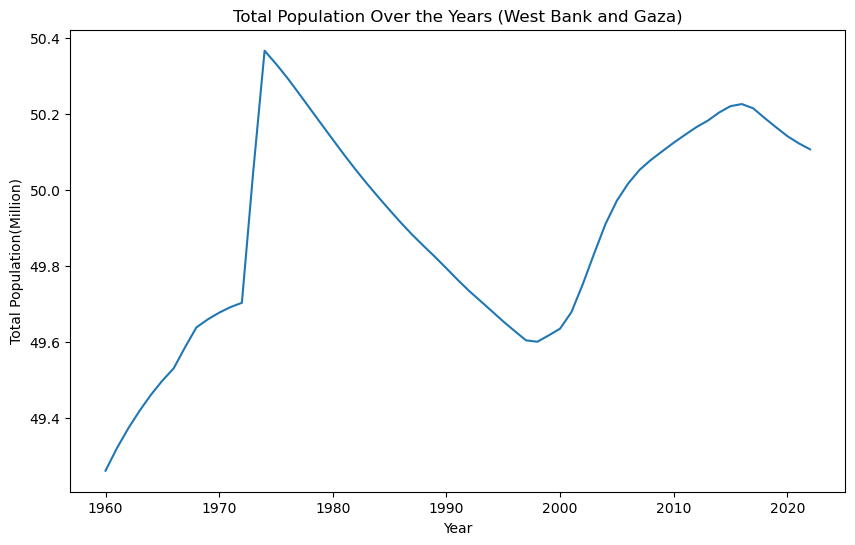

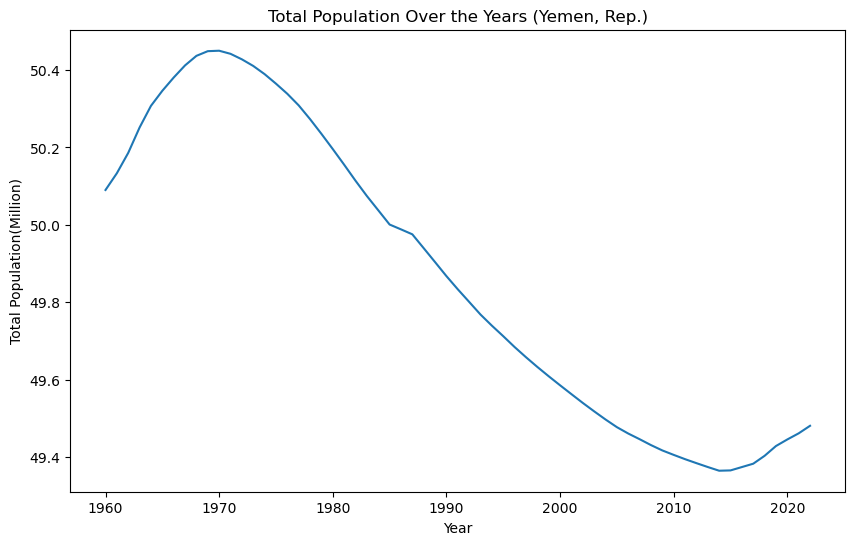

In [20]:
# Group the data by country name and calculate the total population for each country
total_population_by_country = data.groupby('Country Name').sum()['Total Popluation']

# Get unique country names
countries = total_population_by_country.index

# Plotting line chart for each country
for country in countries:
    plt.figure(figsize=(10, 6))
    country_data = data[data['Country Name'] == country]
    plt.plot(country_data['Years'], country_data['Total Popluation'])
    plt.title(f'Total Population Over the Years ({country})')
    plt.xlabel('Year')
    plt.ylabel('Total Population(Million)')
    plt.grid(False)
    plt.show()
